In [1]:
import fastai
from fastai.vision import *
from fastai.callbacks import *
from fastai.vision.gan import *
torch.cuda.get_device_name()

'GeForce GTX 1060'

In [2]:
from pathlib import Path
path = Path('/home/rimijoker/Downloads/Compressed/the-oxfordiiit-pet-dataset')
path_hr = path/'images'
path_lr = path/'bnw'

In [3]:
src = ImageImageList.from_folder(path_lr).split_by_rand_pct(0.1, seed=42)

In [4]:
def get_data(bs,size):
    data = (src.label_from_func(lambda x: path_hr/x.relative_to(path_lr))
           .transform(get_transforms(), size=size, tfm_y=True)
           .databunch(bs=bs, num_workers=1).normalize(imagenet_stats, do_y=True))

    data.c = 3
    return data

In [5]:
#bs,size=32, 128
#bs,size = 24,160
bs,size = 15, 128
arch = models.resnet18
data_gen = get_data(bs,size)

In [6]:
wd = 1e-3
loss_gen = MSELossFlat()
from fastai.callbacks import SaveModelCallback, CSVLogger


In [7]:
from torchvision.models import vgg16_bn
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)
base_loss = F.l1_loss
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [8]:
from torchvision.models import vgg16_bn
def gram_matrix(x):
    n,c,h,w = x.size()
    x = x.view(n, c, -1)
    return (x @ x.transpose(1,2))/(c*h*w)
base_loss = F.l1_loss
vgg_m = vgg16_bn(True).features.cuda().eval()
requires_grad(vgg_m, False)

In [9]:
blocks = [i-1 for i,o in enumerate(children(vgg_m)) if isinstance(o,nn.MaxPool2d)]
blocks, [vgg_m[i] for i in blocks]
class FeatureLoss(nn.Module):
    def __init__(self, m_feat, layer_ids, layer_wgts):
        super().__init__()
        self.m_feat = m_feat
        self.loss_features = [self.m_feat[i] for i in layer_ids]
        self.hooks = hook_outputs(self.loss_features, detach=False)
        self.wgts = layer_wgts
        self.metric_names = ['pixel',] + [f'feat_{i}' for i in range(len(layer_ids))
              ] + [f'gram_{i}' for i in range(len(layer_ids))]

    def make_features(self, x, clone=False):
        self.m_feat(x)
        return [(o.clone() if clone else o) for o in self.hooks.stored]
    
    def forward(self, input, target):
        out_feat = self.make_features(target, clone=True)
        in_feat = self.make_features(input)
        self.feat_losses = [base_loss(input,target)]
        self.feat_losses += [base_loss(f_in, f_out)*w
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.feat_losses += [base_loss(gram_matrix(f_in), gram_matrix(f_out))*w**2 * 5e3
                             for f_in, f_out, w in zip(in_feat, out_feat, self.wgts)]
        self.metrics = dict(zip(self.metric_names, self.feat_losses))
        return sum(self.feat_losses)
    
    def __del__(self): self.hooks.remove()
feat_loss = FeatureLoss(vgg_m, blocks[2:5], [5,15,2])

In [10]:
wd = 1e-3
def create_gen_learner():
    return unet_learner(data_gen, arch, norm_type=NormType.Weight, wd=wd,
                         self_attention=True, loss_func=feat_loss, callback_fns=[CSVLogger])

In [11]:
#learn_gen = create_gen_learner()

In [12]:
name_gen = 'image_gen'
path_gen = Path(path/name_gen)

In [13]:
learn_gen=None
gc.collect()

80

In [14]:
def get_crit_data(classes, bs, size):
    src = ImageList.from_folder(path, include=classes).split_by_rand_pct(0.1, seed=42)
    ll = src.label_from_folder(classes=classes)
    data = (ll.transform(get_transforms(), size=size)
           .databunch(bs=bs).normalize(imagenet_stats))
    data.c = 3
    return data

In [15]:
#data_crit = get_crit_data(['images', name_gen], bs=bs, size=size)

In [16]:
loss_critic = AdaptiveLoss(nn.BCEWithLogitsLoss())

In [17]:
def create_critic_learner(data, metrics):
    return Learner(data, gan_critic(), metrics=metrics, loss_func=loss_critic)

In [18]:
#learn_critic = create_critic_learner(data_crit, accuracy_thresh_expand)

In [19]:
learn_crit=None
learn_gen=None
gc.collect()

120

In [20]:
data_crit = get_crit_data(['bnw', 'images'], bs=bs, size=size)
learn_crit = create_critic_learner(data_crit, metrics=None).load('critic-final')
learn_gen = create_gen_learner().load('genitr20')

In [21]:
switcher = partial(AdaptiveGANSwitcher, critic_thresh=0.70)
learn = GANLearner.from_learners(learn_gen, learn_crit, weights_gen=(1.,50.), show_img=True, switcher=switcher,
                                 opt_func=partial(optim.Adam, betas=(0.,0.99)), wd=wd)
learn.callback_fns.append(partial(GANDiscriminativeLR, mult_lr=5.))

In [22]:
learn.model.cuda()

GANModule(
  (generator): DynamicUnet(
    (layers): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU(inplace=True)
        (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
        (4): Sequential(
          (0): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (relu): ReLU(inplace=True)
            (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
            (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          )
          (1): BasicBlock(
            (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 

epoch,train_loss,valid_loss,gen_loss,disc_loss,time


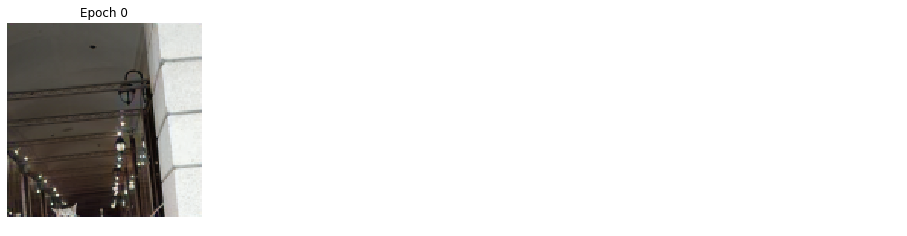

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


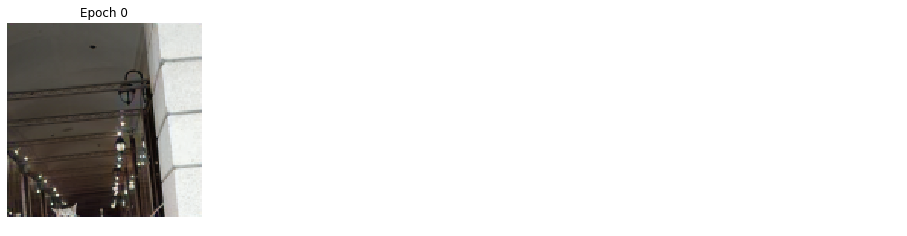

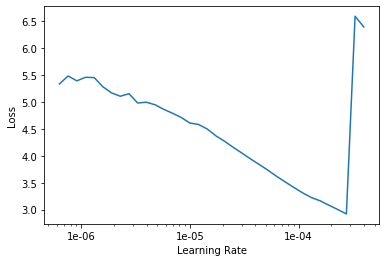

In [23]:
learn.lr_find()
learn.recorder.plot()

epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,58.545586,65.834846,117.627968,0.303172,11:09
1,59.990299,63.166451,118.187859,0.308616,11:14
2,59.103813,66.192467,118.397598,0.311674,11:21
3,59.045853,63.173119,116.700508,0.307068,11:06
4,59.512897,63.250656,117.549042,0.308249,11:21
5,57.825569,66.067688,117.895332,0.294350,11:47
6,59.794277,63.803555,118.232567,0.285436,11:53
7,58.939346,65.959038,118.293617,0.279114,11:51
8,58.944527,63.114834,116.793152,0.283840,11:59
9,58.411102,65.952194,117.344872,0.266778,11:50


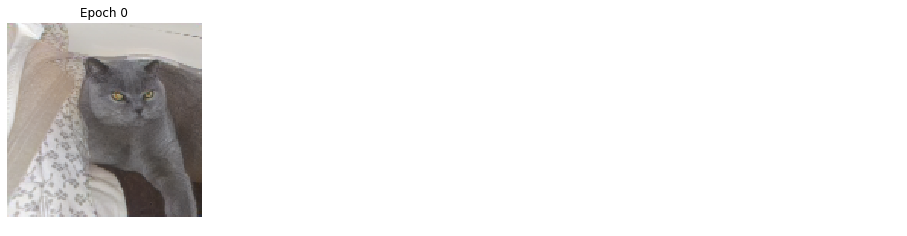

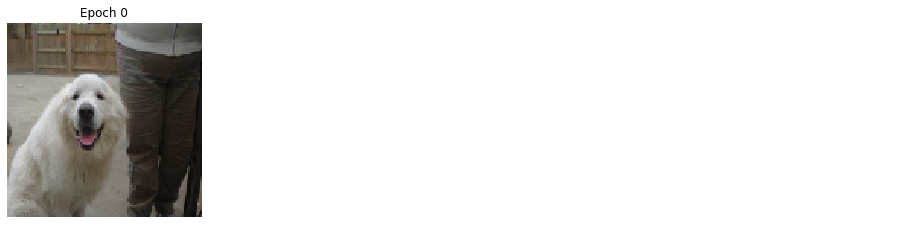

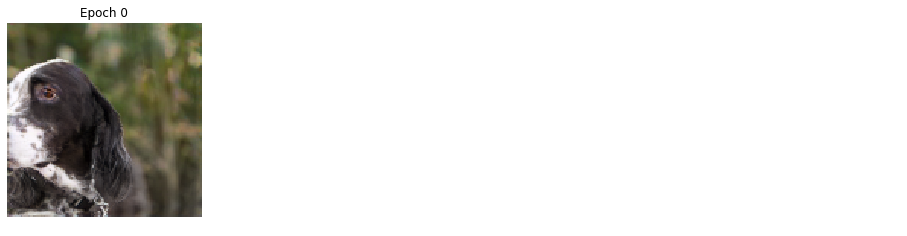

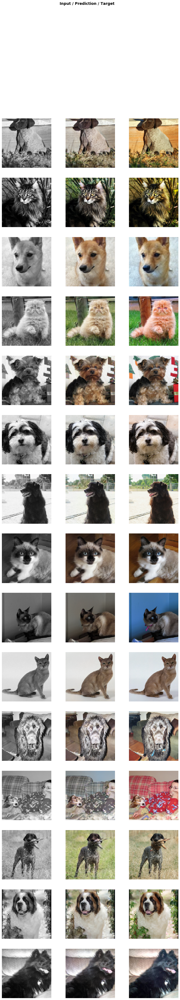

In [24]:
for i in range(3):
    learn.fit(10, slice(((1e-5)+(1e-4))/2))
    learn.save('gangenitr3' + str(i))
    learn.show_results(rows=15)


epoch,train_loss,valid_loss,gen_loss,disc_loss,time
0,63.554451,64.216278,124.983856,0.353666,06:10
1,62.270889,66.040146,125.338173,0.329906,07:04
2,61.105053,65.935738,123.992661,0.319530,08:11
3,61.012299,66.043922,124.229599,0.313747,08:34
4,61.295589,65.784286,124.549263,0.312173,09:08
5,61.760662,66.129204,124.762718,0.311032,09:30
6,61.363419,65.923759,124.418259,0.310321,08:42
7,63.459496,64.265961,124.824112,0.289016,08:35
8,62.875477,66.098915,125.604050,0.291681,08:30
9,63.010521,64.467453,124.556221,0.292924,09:15


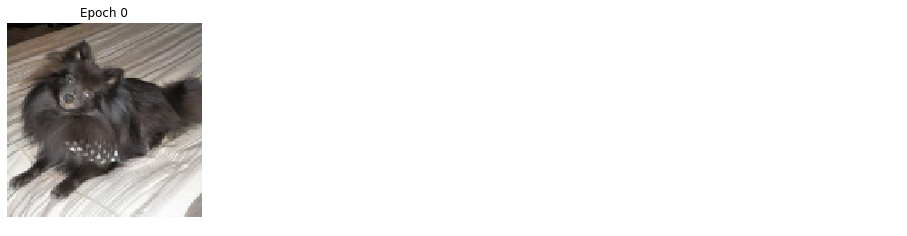

In [23]:
learn.fit(10, slice(1e-5))

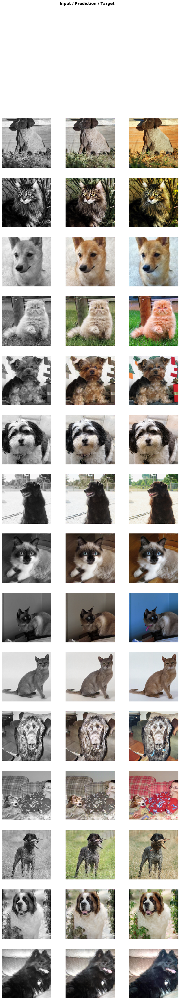

In [24]:
learn.show_results(rows=15)

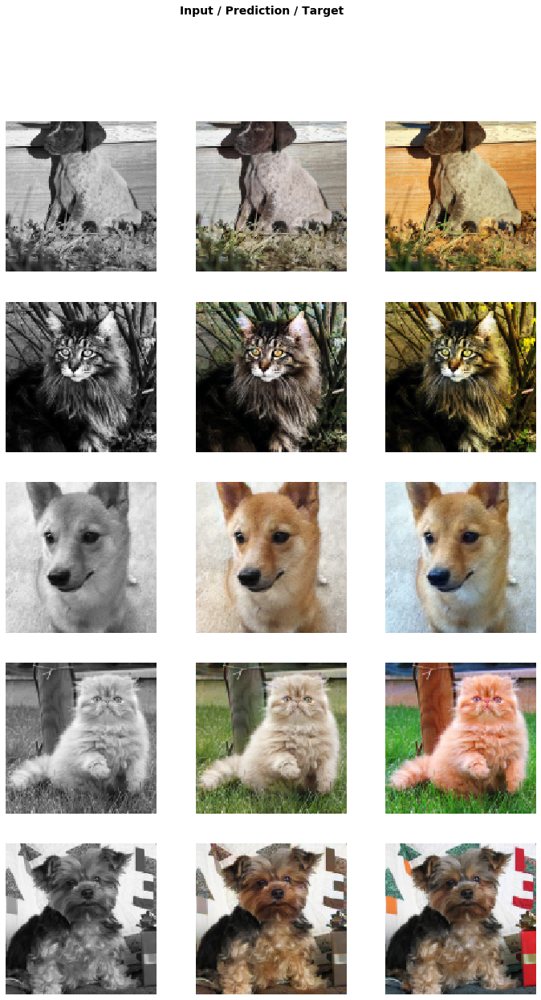

In [25]:
learn_gen.show_results()

In [25]:
learn_gen.save("genitr2final")

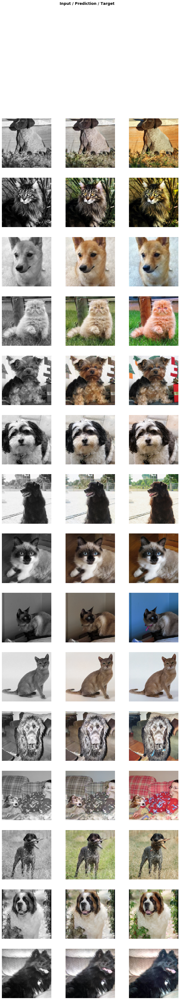

In [26]:
learn_gen.show_results(rows=50)

In [27]:
for i in range(1):
    learn.load('gangenitr2' + str(i))
    learn_gen.save('genitr2' + str(i))

In [28]:
learn.load('gangenitr20')

e=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (relu): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            )
          )
          (5): Sequential(
            (0): BasicBlock(
              (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
              (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (relu): ReLU(inplace=True)
              (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
              (downsample): Sequential(
                (0): Conv2d(64,